<a href="https://colab.research.google.com/github/ishika9/Image-Processing-With-Deep-Learning/blob/main/dups_customdata.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
!unzip /content/drive/MyDrive/101D3200.zip

Archive:  /content/drive/MyDrive/101D3200.zip
replace __MACOSX/._101D3200? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace 101D3200/DSC_1702.JPG? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace __MACOSX/101D3200/._DSC_1702.JPG? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


In [3]:
pip install fiftyone

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [4]:
import fiftyone as fo

In [5]:
dataset = fo.Dataset.from_images_dir("/content/101D3200")

 100% |█████████████████| 196/196 [71.3ms elapsed, 0s remaining, 2.7K samples/s]   


INFO:eta.core.utils: 100% |█████████████████| 196/196 [71.3ms elapsed, 0s remaining, 2.7K samples/s]   


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


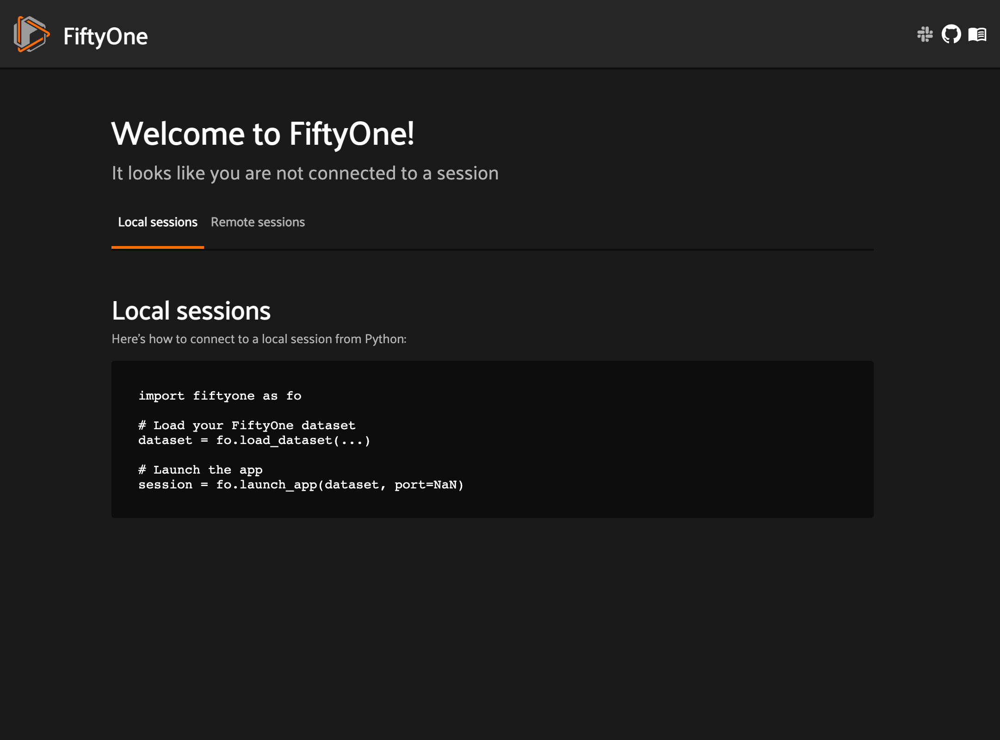

<IPython.core.display.Javascript object>

In [6]:
session= fo.launch_app(dataset)

In [7]:
import fiftyone.zoo as foz
from fiftyone import ViewField as F

In [8]:
model= foz.load_zoo_model("mobilenet-v2-imagenet-torch")
embeddings= dataset.compute_embeddings(model)

print(embeddings.shape)

/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


 100% |█████████████████| 196/196 [8.2m elapsed, 0s remaining, 0.4 samples/s]     


INFO:eta.core.utils: 100% |█████████████████| 196/196 [8.2m elapsed, 0s remaining, 0.4 samples/s]     


(196, 1280)


In [9]:
from sklearn.metrics.pairwise import cosine_similarity
similarity_matrix = cosine_similarity(embeddings)

print(similarity_matrix.shape)

# The N x N similarity matrix provides a value between 0 (low similarity) and 1 (identical) for each pair of your N samples

(196, 196)


In [10]:
import numpy as np

n=len(similarity_matrix)
similarity_matrix= similarity_matrix- np.identity(n)

In [11]:
id_map = [s.id for s in dataset.select_fields(["id"])]
#creates a list called id_map that contains the id field for each element in the dataset.
#The id_map list will contain the id field for each element in the dataset. For example, if the dataset object contains 10 elements, the id_map list will contain 10 elements, one for each element in the dataset
for idx, sample in enumerate(dataset):
  max_similarity= similarity_matrix[idx].max()
  sample["max_similarity"]= max_similarity
  sample.save()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


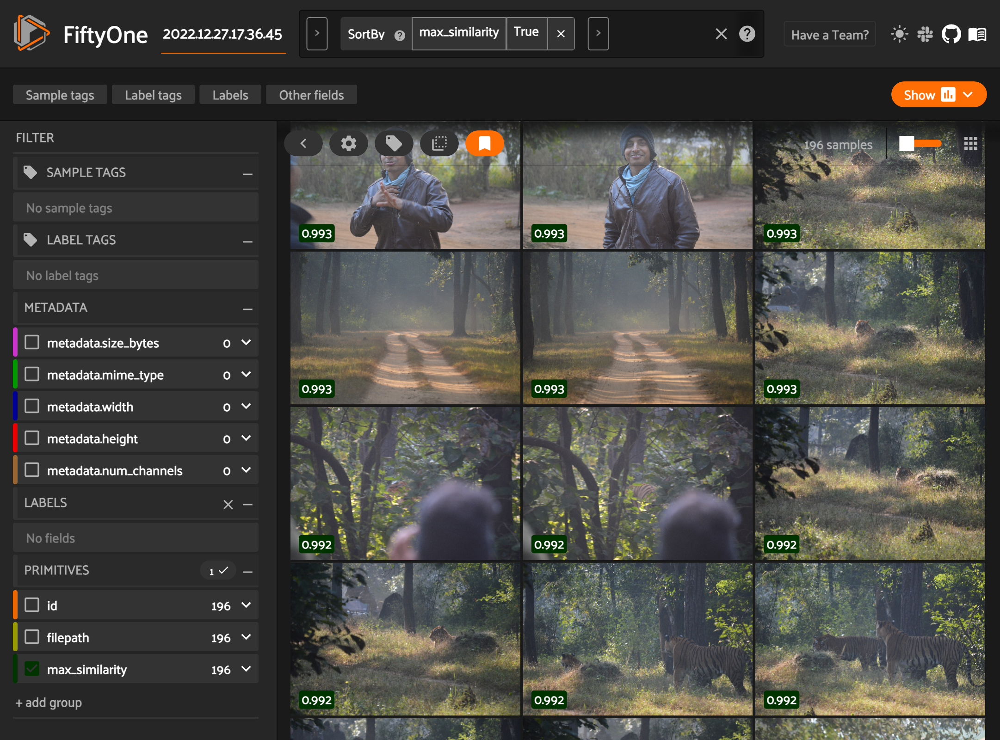

<IPython.core.display.Javascript object>

In [13]:
session.show()

In [14]:
dataset.match(F("max_similarity")>0.991)

Dataset:     2022.12.27.17.36.45
Media type:  image
Num samples: 30
Sample fields:
    id:             fiftyone.core.fields.ObjectIdField
    filepath:       fiftyone.core.fields.StringField
    tags:           fiftyone.core.fields.ListField(fiftyone.core.fields.StringField)
    metadata:       fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.metadata.ImageMetadata)
    max_similarity: fiftyone.core.fields.FloatField
View stages:
    1. Match(filter={'$expr': {'$gt': [...]}})

In [16]:
thresh = 0.991
samples_to_remove = set()
samples_to_keep = set()

for idx, sample in enumerate(dataset):
    if sample.id not in samples_to_remove:
        # Keep the first instance of two duplicates
        samples_to_keep.add(sample.id)
        
        dup_idxs = np.where(similarity_matrix[idx] > thresh)[0]
        for dup in dup_idxs:
            # We kept the first instance so remove all other duplicates
            samples_to_remove.add(id_map[dup])

        if len(dup_idxs) > 0:
            sample.tags.append("has_duplicates")
            sample.save()

    else:
        sample.tags.append("duplicate")
        sample.save()
print(len(samples_to_remove) + len(samples_to_keep))


196


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


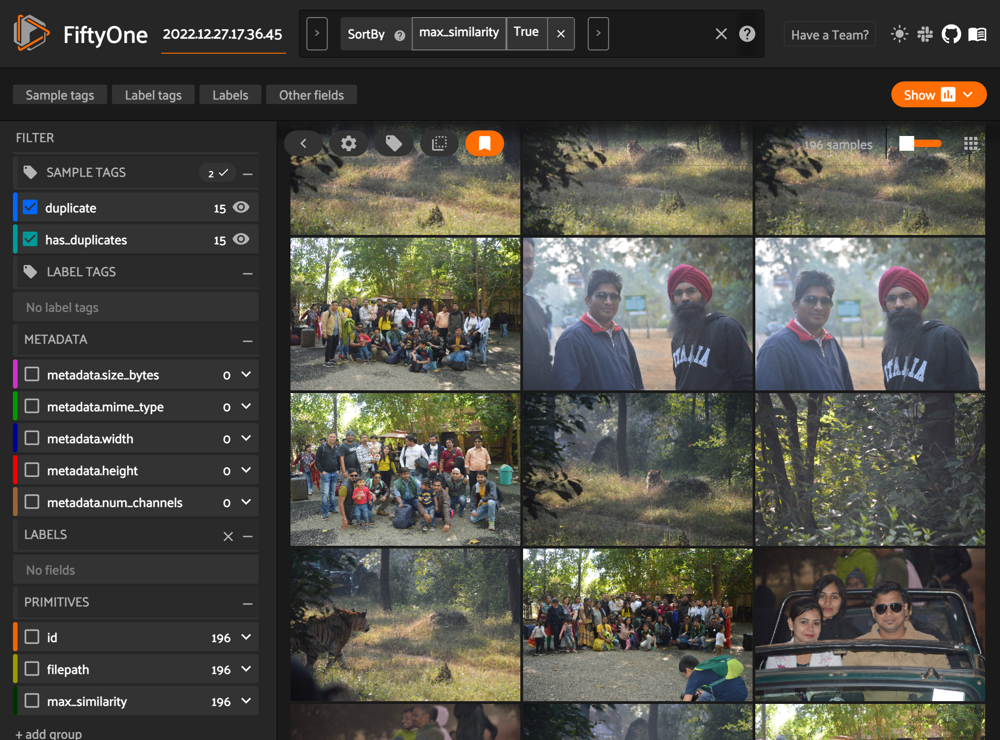

<IPython.core.display.Javascript object>

In [17]:
session.show()

In [19]:
dataset.remove_samples(list(samples_to_remove))

<ipython-input-19-d233dad0f55f>:1: DeprecationWarning: Call to deprecated method remove_samples. (Use delete_samples() instead)
  dataset.remove_samples(list(samples_to_remove))


In [20]:
session.show()